<a href="https://colab.research.google.com/github/indremontvilaite/class_b_lidaris/blob/main/Lidaris01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/Britefury/django-labeller.git
!python setup.py install

Cloning into 'django-labeller'...
remote: Enumerating objects: 2065, done.
remote: Counting objects: 100% (480/480), done.
remote: Compressing objects: 100% (327/327), done.
remote: Total 2065 (delta 285), reused 327 (delta 153), pack-reused 1585
Receiving objects: 100% (2065/2065), 11.12 MiB | 23.15 MiB/s, done.
Resolving deltas: 100% (1397/1397), done.
python3: can't open file 'setup.py': [Errno 2] No such file or directory


In [9]:
!python -m image_labelling_tool.flask_labeller --images_pat=<S002152_T002998/Photos/10x_after>/*.<jpg>

/bin/bash: -c: line 0: syntax error near unexpected token `newline'
/bin/bash: -c: line 0: `python -m image_labelling_tool.flask_labeller -images_pat=<S002152_T002998/Photos/10x_after>/*.<jpg>'


In [ ]:
!pip install git+https://github.com/fastai/fastai -qq

     |████████████████████████████████| 61kB 5.4MB/s 
     |████████████████████████████████| 12.8MB 11.3MB/s 
     |████████████████████████████████| 776.8MB 22kB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.7.1 which is incompatible.


In [ ]:
!pip install nbdev -qq

     |████████████████████████████████| 51kB 4.3MB/s 
     |████████████████████████████████| 51kB 4.8MB/s 


In [ ]:
from fastai.vision.all import *
from nbdev.showdoc import *

In [41]:
import numpy as np
import os
import PIL
from PIL import Image
from numpy import asarray
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img

In [5]:
%cd '/content/drive/MyDrive/Data/Lidaris'

/content/drive/MyDrive/Data/Lidaris


In [2]:
path = '/content/drive/MyDrive/Data/Lidaris'

In [ ]:
# !unzip '/content/drive/MyDrive/Data/Lidaris/S002152_T002998.zip'

In [71]:
#photo with damage
img_before_d = Image.open('S002152_T002998/Photos/10x_before/site10.jpg')
img_after_d = Image.open('S002152_T002998/Photos/10x_after/site10.jpg')
np_before_d = asarray(img_before_d)
np_after_d = asarray(img_after_d) 

In [66]:
#photo without damage
img_before = Image.open('S002152_T002998/Photos/10x_before/site5.jpg')
img_after = Image.open('S002152_T002998/Photos/10x_after/site5.jpg')
np_before = asarray(img_before)
np_after = asarray(img_after) 

In [30]:
print(numpydata.shape)
pilImage = Image.fromarray(np_before)
print(type(pilImage))
print(pilImage.mode)
print(pilImage.size)

(1944, 2592, 3)
<class 'PIL.Image.Image'>
RGB
(2592, 1944)


In [85]:
np_label_d = np.subtract(np_after_d, np_before_d)
np.unique(np_label_d)
np_label = np.subtract(np_after, np_before)
#np_label

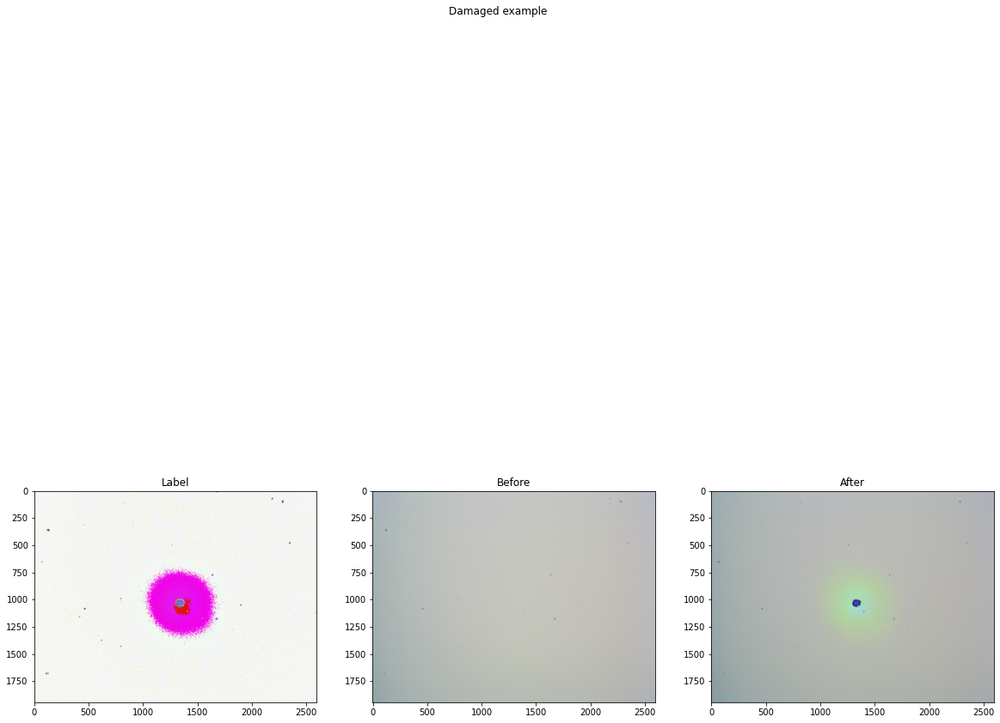

In [73]:
plt.figure(figsize=(20, 20))

ax = plt.subplot(1, 3, 1)
plt.imshow(np_label_d)
plt.title('Label')
ax = plt.subplot(1, 3, 2)
plt.imshow(np_before_d)
plt.title('Before')
ax = plt.subplot(1, 3, 3)
plt.imshow(np_after_d)
plt.title('After')

plt.suptitle('Damaged example')
plt.show()

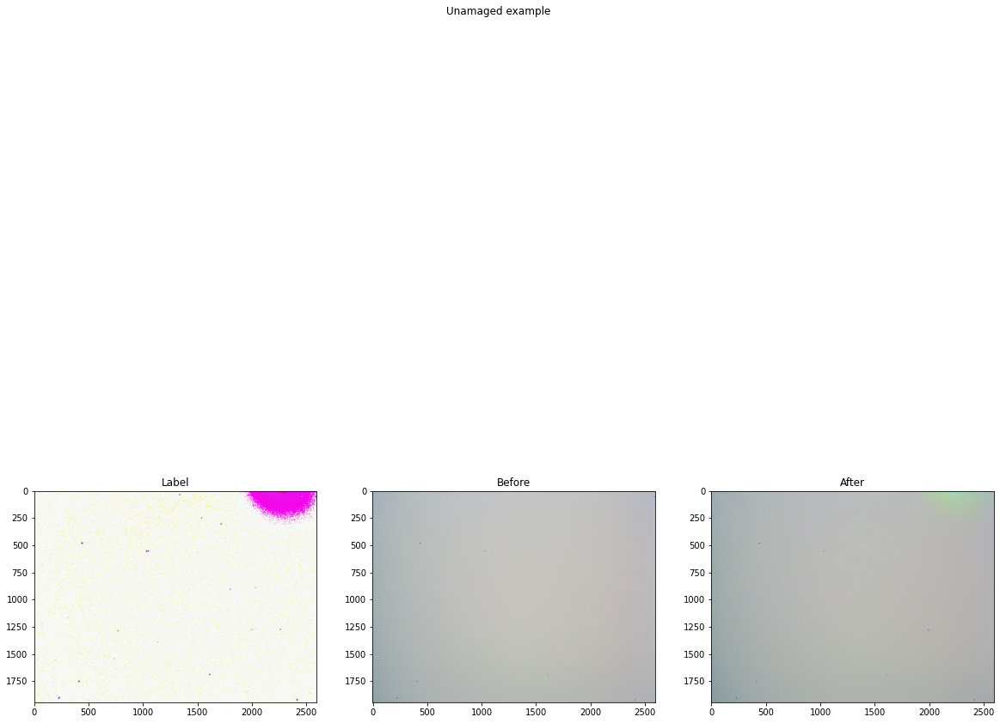

In [68]:
plt.figure(figsize=(20, 20))

ax = plt.subplot(1, 3, 1)
plt.imshow(np_label)
plt.title('Label')
ax = plt.subplot(1, 3, 2)
plt.imshow(np_before)
plt.title('Before')
ax = plt.subplot(1, 3, 3)
plt.imshow(np_after)
plt.title('After')

plt.suptitle('Unamaged example')
plt.show()

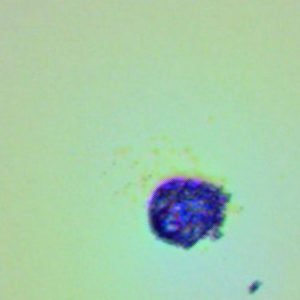

In [77]:
array_to_img(np_after_d).crop((2592/2-150, 1944/2-150, 2592/2+150, 1944/2+150,))

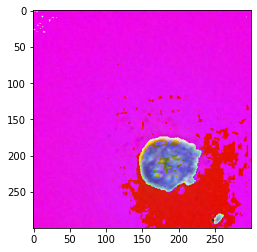

In [84]:
row0 = int(1944/2-150)
row1 = int(1944/2+150)
column0 = int(2592/2-150)
column1 = int(2592/2+150)

plt.imshow(np_label_d[row0:row1, column0:column1, :])

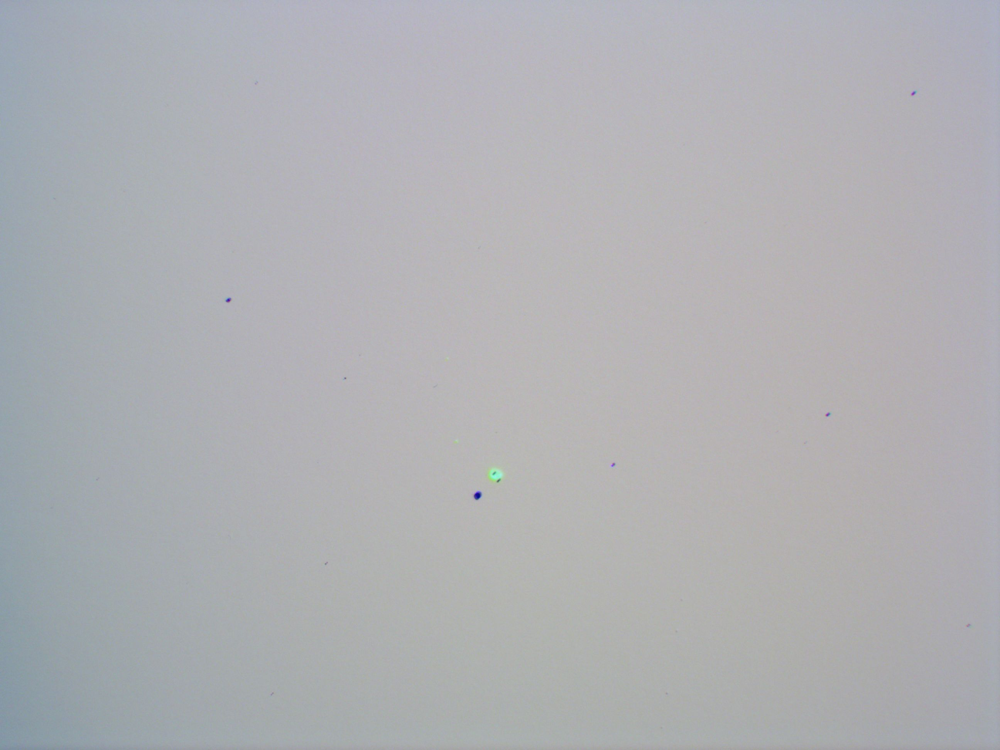

In [96]:
#photo with damage
globals() 
i = 36
img_before_i = Image.open(f'S002152_T002998/Photos/10x_before/site{i}.jpg')
img_after_i = Image.open(f'S002152_T002998/Photos/10x_after/site{i}.jpg')
np_before_i = asarray(img_before_i)
np_after_i = asarray(img_after_i) 
np_label_i = np.subtract(np_after_i, np_before_i)

img_after_i

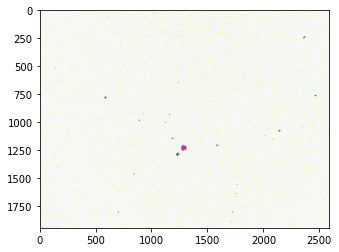

In [94]:
plt.imshow(np_label_i)

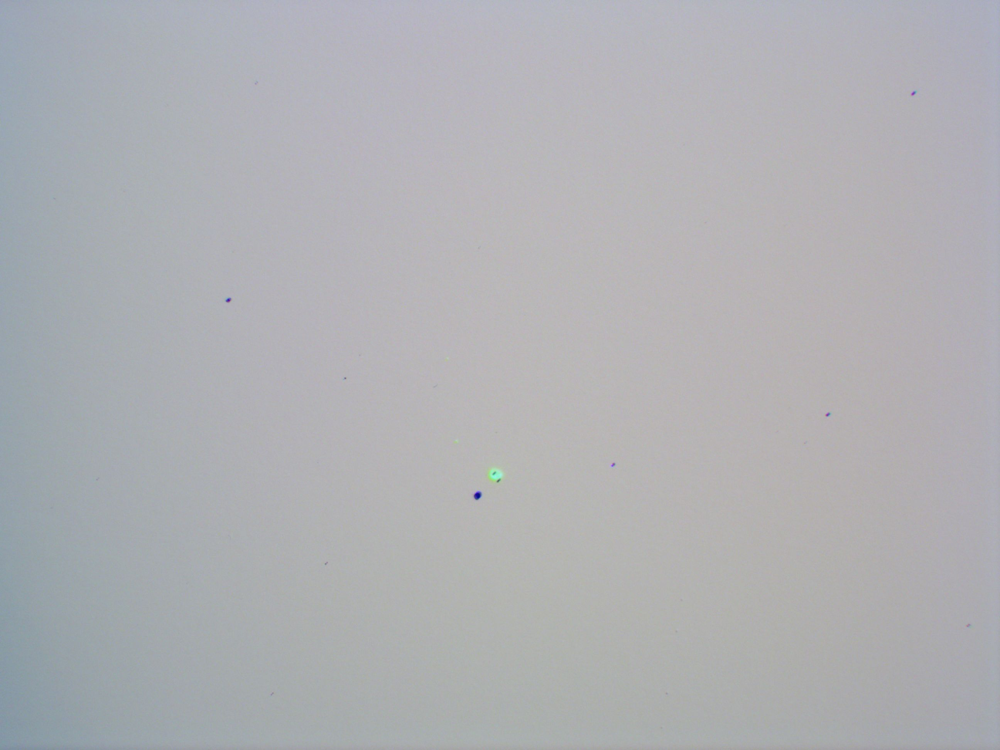

In [93]:
fname_after = 'S002152_T002998/Photos/10x_after/site36.jpg'
pic_after = PIL.Image.open(str(fname_after))
pic_after

In [17]:
ds_tensor= image_dataset_from_directory(
    'S002152_T002998/Photos',
    labels='inferred',
    image_size=[1944, 2592],
    interpolation='nearest',
)

Found 842 files belonging to 2 classes.


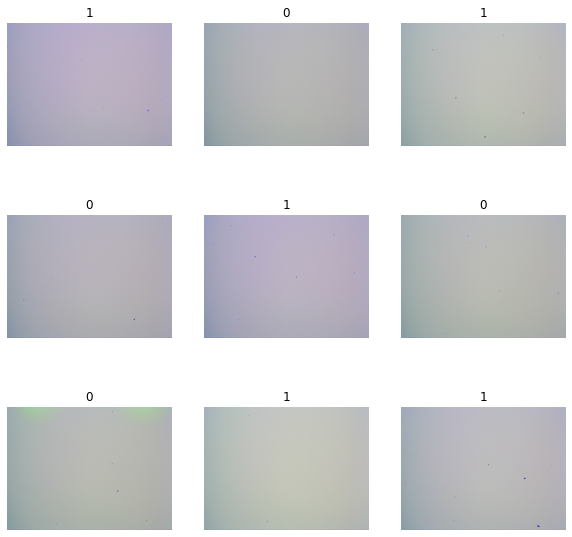

In [19]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in ds_tensor.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")

In [20]:
ds_tensor.type

AttributeError: ignored